## Detect Object bounding box


Setting the Detectron2.

In [5]:
# lib
from os.path import join, isfile, isdir
from os import listdir
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from argparse import ArgumentParser

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

import torch

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)

input_dir = "example/test_08_15/"
image_list = [f for f in listdir(input_dir) if isfile(join(input_dir, f))]
output_npz_dir = "{0}_bbox".format(input_dir)

In [17]:
def bbox(image_path):
    img = cv2.imread(join(input_dir, image_path))
    lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab_image)
    l_stack = np.stack([l_channel, l_channel, l_channel], axis=2)
    outputs = predictor(l_stack)
    save_path = join(output_npz_dir, image_path.split('.')[0])
    pred_bbox = outputs["instances"].pred_boxes.to(torch.device('cpu')).tensor.numpy()
    pred_scores = outputs["instances"].scores.cpu().data.numpy()
    print(f"image_path : {image_path}")
    print(f"scores : {pred_scores}")
    print(f"bbox : {pred_bbox}")
    return pred_bbox, pred_scores

class CFG:
    img = image_list[0] # 이미지 하나 선택 (이미지 index) # 1 = 9 , 3 = 10
    box_num_ls = [8,100] # 2개씩 비교할때 필요 (bbox 개수)

In [21]:
### only CAR!
def bbox(image_path):
    img = cv2.imread(join(input_dir, image_path))
    lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab_image)
    l_stack = np.stack([l_channel, l_channel, l_channel], axis=2)
    outputs = predictor(l_stack)
    save_path = join(output_npz_dir, image_path.split('.')[0])
    
    outputs["instances"] = outputs["instances"][outputs["instances"].pred_classes == 2]
    pred_bbox = outputs["instances"].pred_boxes.to(torch.device('cpu')).tensor.numpy()
    pred_scores = outputs["instances"].scores.cpu().data.numpy()
#     print(f"image_path : {image_path}")
#     print(f"scores : {pred_scores}")
#     print(f"bbox : {pred_bbox}")
    return pred_bbox, pred_scores

class CFG:
    img = image_list[0] # 이미지 하나 선택 (이미지 index) # 1 = 9 , 3 = 10
#     box_num_ls = [8,100] # 2개씩 비교할때 필요 (bbox 개수)

## bbox와 성능의 상관관계 (이미지 2개 비교)

In [95]:
def show_image(image_path, bbox, score, num):
    color_img1 = Image.open(f"./results/{num[0]}/"+image_path.replace("jpg","png")).convert("RGB")   
    color_img2 = Image.open(f"./results/{num[1]}/"+image_path.replace("jpg","png")).convert("RGB")   

    fig, ax = plt.subplots(figsize=(30,30), nrows=1, ncols=2)

    ax[0].imshow(color_img1)
    ax[0].set_title(f"{num[0]} box", fontsize=50)
    ax[1].imshow(color_img2)
    ax[1].set_title(f"{num[1]} box", fontsize=50)
    plt.show()
    
def draw_multi_bbox(image_path, bbox, score, num):
    image = Image.open("./example/"+image_path).convert("RGB")
    color_img = Image.open(f"./results/{num}/"+image_path.replace("jpg","png"))
    fig, ax = plt.subplots(figsize=(30,30), nrows=1, ncols=2)
    
    if len(bbox)>num:
        index_mask = np.argsort(score, axis=0)[len(bbox)-num:len(bbox)]
        bbox = bbox[index_mask]
        
        score = score[index_mask]
    
    # Draw boxes and add label to each box
    for box in bbox:
        bb = patches.Rectangle((box[0],box[1]), box[2],box[3], linewidth=8, edgecolor="blue", facecolor="none")
        ax[0].add_patch(bb)
        
    ax[0].imshow(image)
    ax[0].set_title(f"score {score}")
    ax[1].imshow(color_img)
    plt.show()
    
def compare_two(img, box_num_ls, show_box=False):
    
    box, score = bbox(img)

    # bbox와 colorimage 같이 출력
    if show_box:
        for i in box_num_ls:
            draw_multi_bbox(img, box, score, num=i)
            
    # color image 끼리 비교
    else:    
        show_image(img, box, score, box_num_ls)

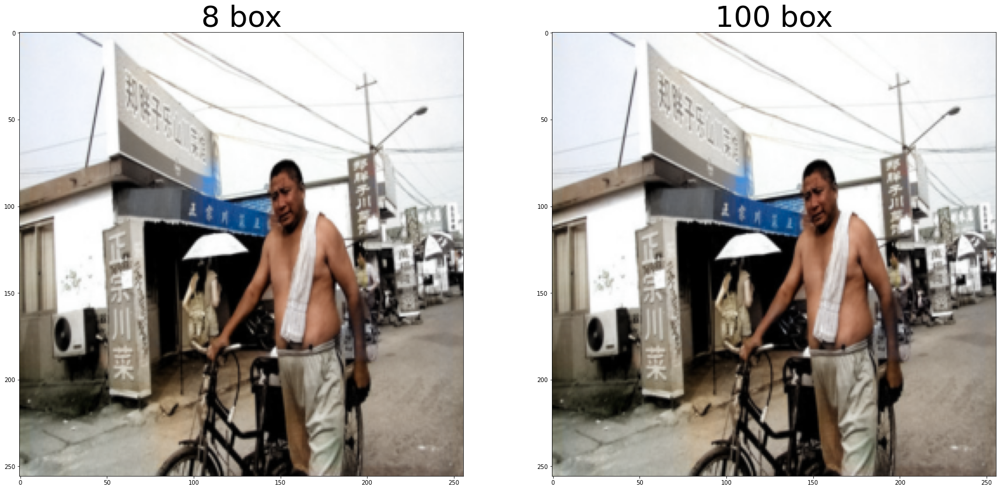

In [96]:
# color image 끼리 비교
compare_two(CFG.img, CFG.box_num_ls)

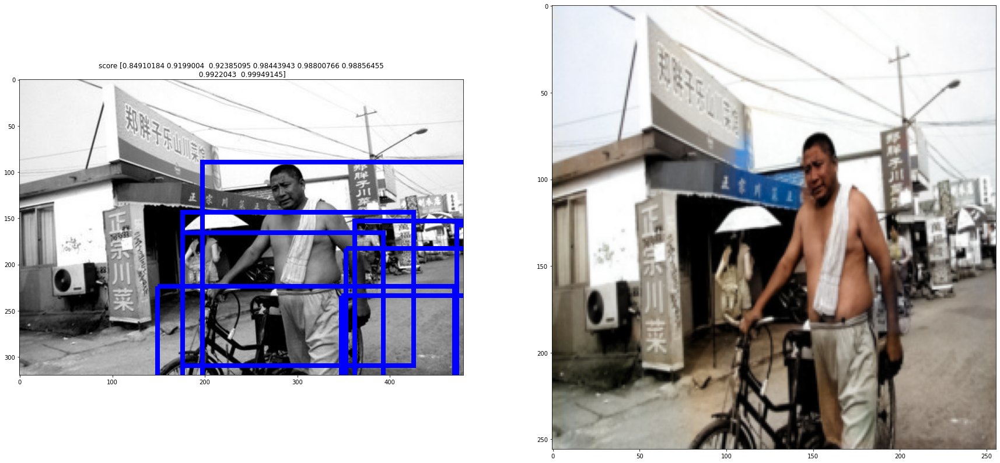

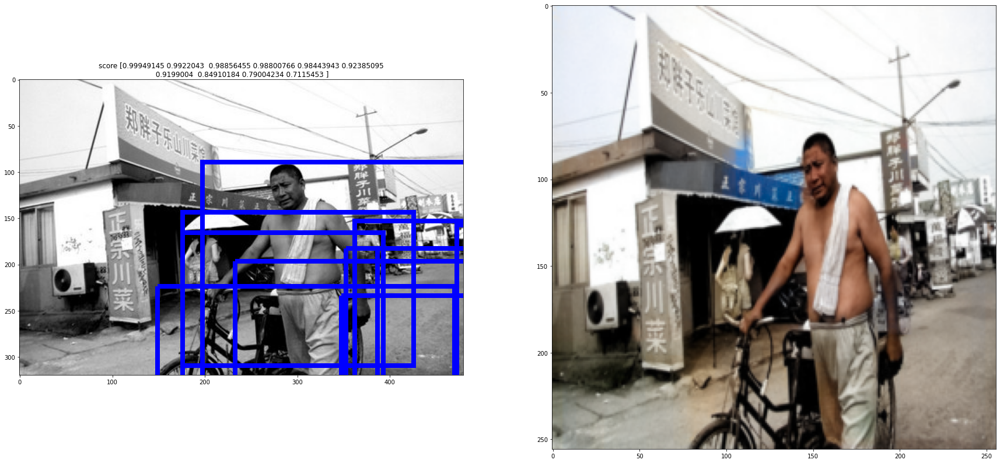

In [97]:
# bbox와 colorimage 같이 출력
compare_two(CFG.img, CFG.box_num_ls, show_box=True)

## 전체 img에 대해 colorization결과 + bbox뽑기

In [18]:
 def compare_all():
    for image_path in image_list:
        box, score = bbox(image_path)
        image = Image.open("./example/"+image_path).convert("RGB")
        color_img = Image.open("./results/"+image_path.replace("jpg","png"))
        fig, ax = plt.subplots(figsize=(15,30), nrows=1, ncols=2)
        # Draw boxes and add label to each box
        for b in box:
            bb = patches.Rectangle((b[0],b[1]), b[2],b[3], linewidth=2, edgecolor="blue", facecolor="none")
            ax[0].add_patch(bb)
        ax[0].imshow(image)
        ax[1].imshow(color_img)
        plt.show()

In [24]:
 def compare_all():
    for image_path in image_list:
        box, score = bbox(image_path)
        image = Image.open("./example/test_08_15/"+image_path).convert("RGB")
        color_img = Image.open("./example/test_08_15/"+image_path.replace("jpg","png"))
        fig, ax = plt.subplots(figsize=(15,30), nrows=1, ncols=2)
        # Draw boxes and add label to each box
        for b in box:
            bb = patches.Rectangle((b[0],b[1]), b[2],b[3], linewidth=2, edgecolor="blue", facecolor="none")
            ax[0].add_patch(bb)
        ax[0].imshow(image)
        ax[1].imshow(color_img)
        plt.show()

image_path : 000162.png
scores : [0.9937364  0.9919923  0.9917241  0.99150753 0.956405   0.93331724]
bbox : [[1497.4622     543.4431    2156.519      958.90814  ]
 [ 998.36475    503.57593   1682.9111     853.52783  ]
 [   7.735882   683.1718     739.701     1127.0692   ]
 [1577.9242     303.63223   2160.         614.3803   ]
 [ 576.4101     423.42426   1334.6959     828.1782   ]
 [2030.3114       6.6820855 2160.         158.86389  ]]


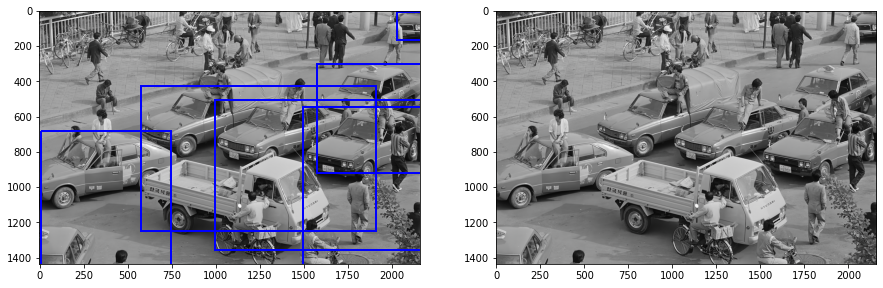

In [25]:
# 전체 img에 대해 bbox뽑기
compare_all()

## bbox 개수별 이미지 출력 (전체 비교)

In [59]:
def compare_one(box, num, show_box=False):
    
    if show_box:
        image = Image.open("./example/"+CFG.img)
        color_img = Image.open(f"./results/{num}/{CFG.img}".replace("jpg","png"))
        fig, ax = plt.subplots(figsize=(15,30), nrows=1, ncols=2)
        # Draw boxes and add label to each box
        for b in box:
            bb = patches.Rectangle((b[0],b[1]), b[2],b[3], linewidth=4, edgecolor="blue", facecolor="none")
            ax[0].add_patch(bb)
            num-=1
            if num<=0:
                break
        ax[0].imshow(image)
        ax[1].imshow(color_img)
        
    else:
        row = len(num)//2+1
        if len(num)%2==0:
            row = len(num)//2

        fig, ax = plt.subplots(figsize=(15,30), nrows=row, ncols=2)
        for i in range(len(num)):
            x = i//2
            y = i%2
            img = Image.open(f"./results/{num[i]}/"+ CFG.img.replace("jpg","png")) 
            ax[x,y].imshow(img)
            ax[x,y].set_title(f"{num[i]} box", fontsize=30)
    
    plt.show()
    
box, score = bbox(CFG.img)
box_len = len(box)
if len(box) > 8:
    box_len = 8

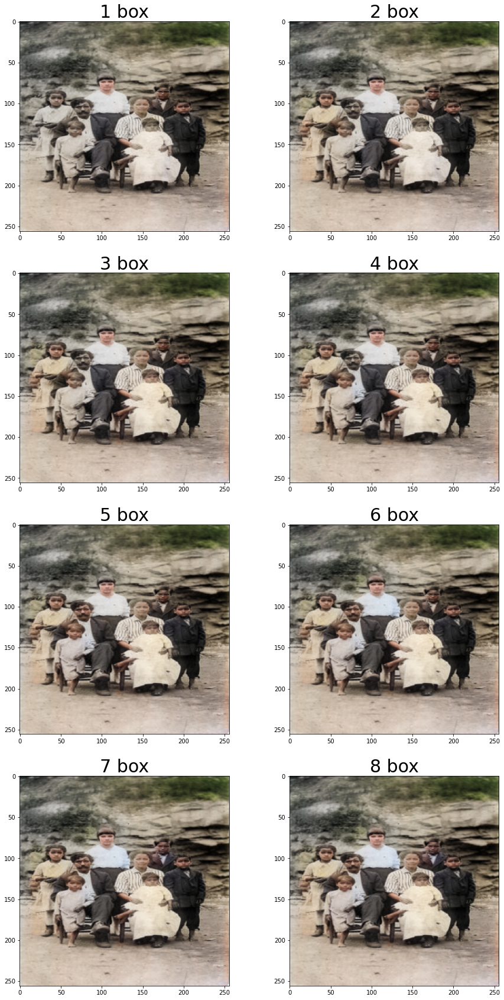

In [60]:
# 한 이미지에 대해 box별 colorization결과 출력
compare_one(box, num=[i for i in range(1,box_len+1)])

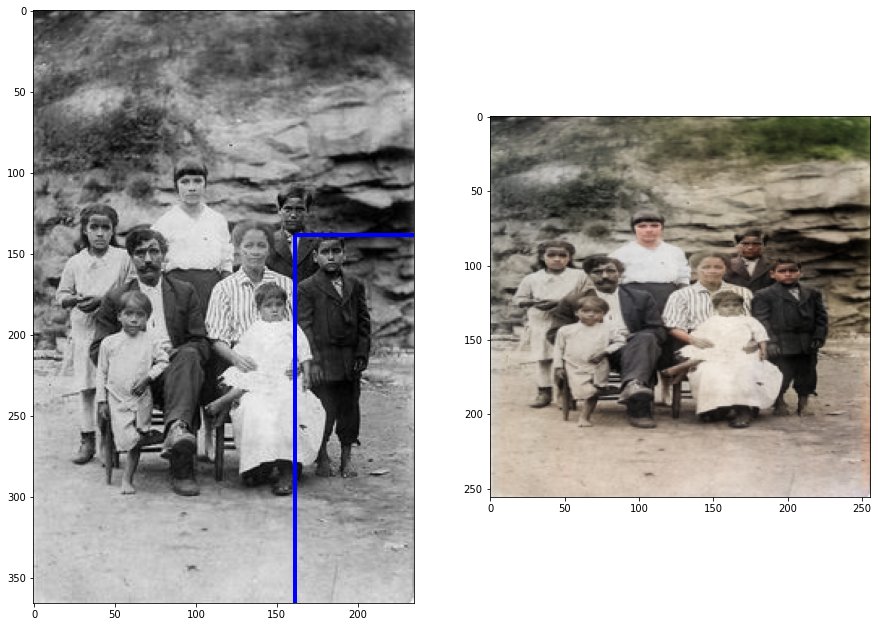

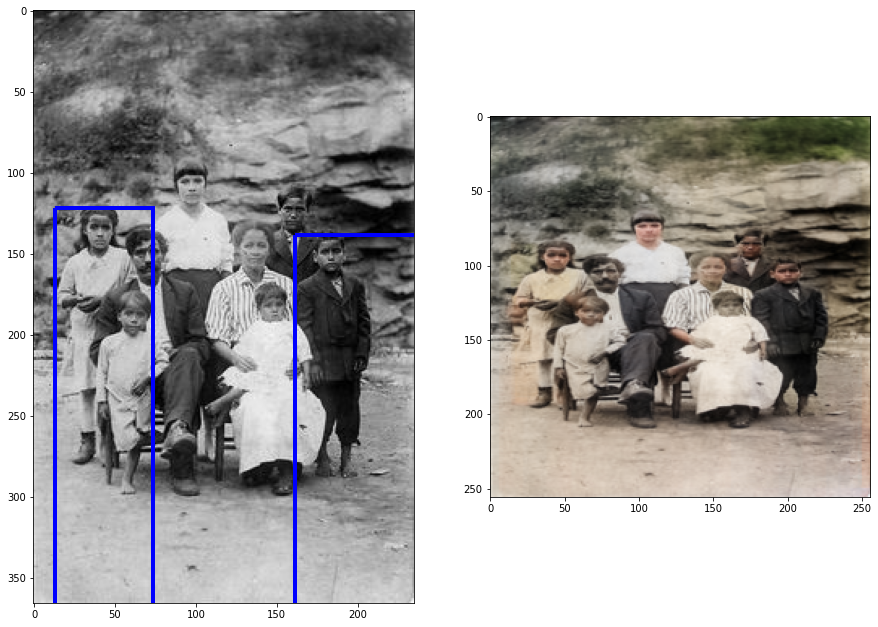

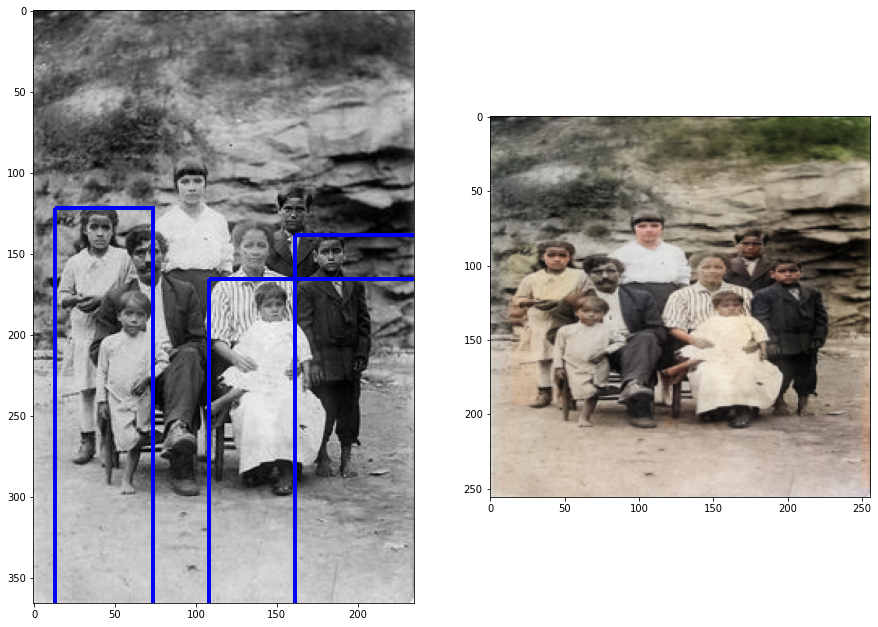

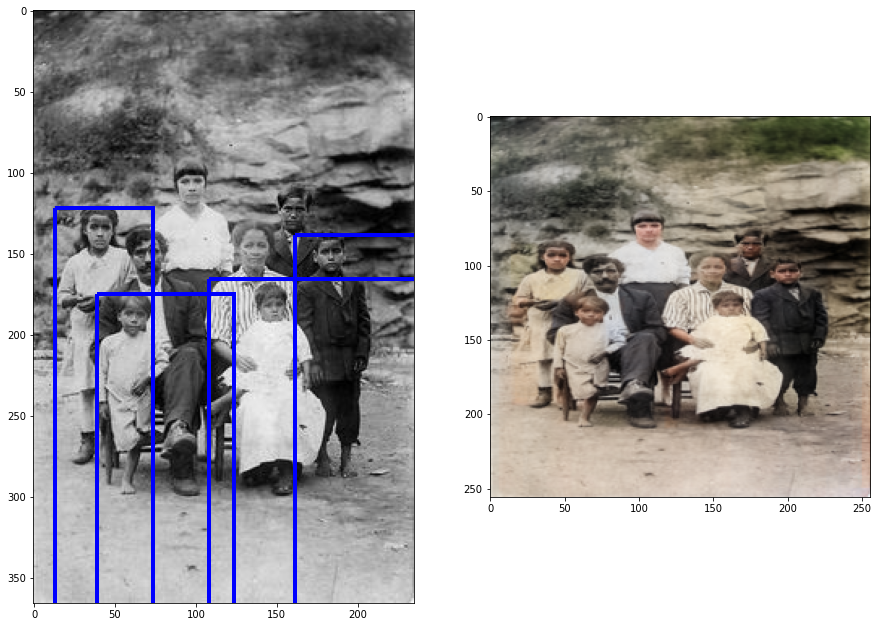

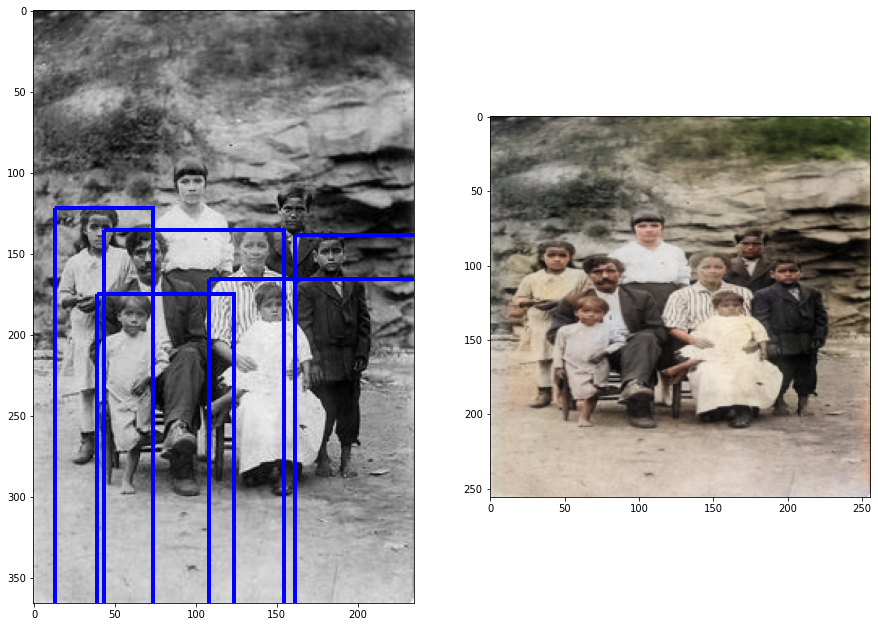

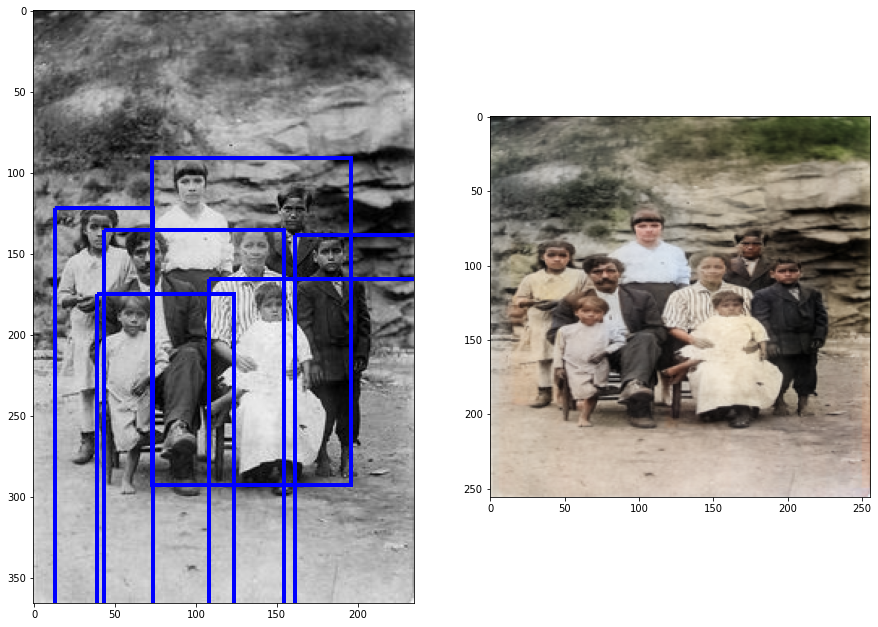

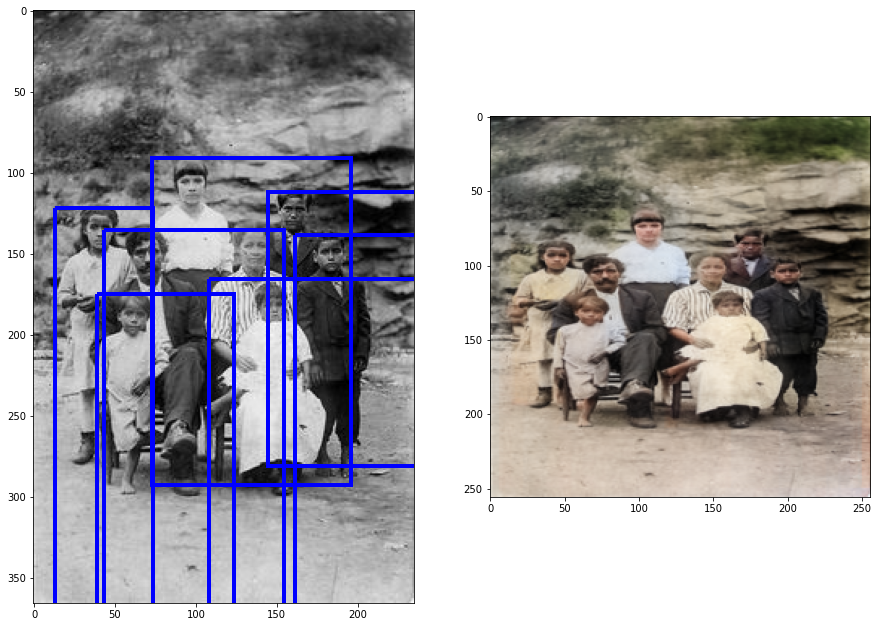

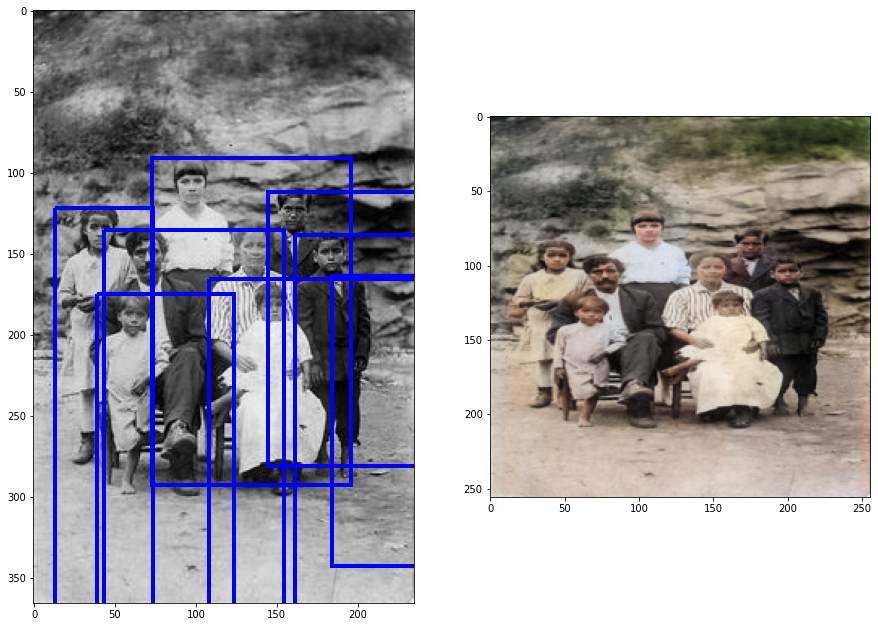

In [61]:
# 한 이미지에 대해 box별 colorization결과 출력 (bbox표시)
for i in range(1,box_len+1):
    compare_one(box, num=i, show_box=True)

In [ ]:
# 0 [1,2] 오른쪽 하단 바닥 색
# 0 [1,3] 가운데 여자애 주변 바닥 보면 조금 색칠해짐
# 0 [3,8] bbox가 많다고 좋은게 아님 (bbox가 많다고 무조건 좋은건 아님)

# 1 [1,3] 왼쪽 여자애 칠해짐, 안겨있는 남자애 색칠해짐
# 1 [4,5] 아저씨 칠해짐

# 2 [1,3] 오른쪽에 bbox가 많이 겹치는 부분 (차를 나무로 인식했다가 점점 차 색깔을 입힘) 

# 5 [3,6] 여자 치마 이상함 bbox가 많아지면 더 이상해짐